<a href="https://colab.research.google.com/github/filipemtz/neuralnets/blob/main/Denoising_Auto_Encoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!python -m pip install pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 708 kB 4.6 MB/s 
     |████████████████████████████████| 5.9 MB 72.4 MB/s 
     |████████████████████████████████| 529 kB 60.3 MB/s 
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.10.1 which is incompatible.


In [6]:
!unzip ./cleaning.zip -d imgs/ 

Archive:  ./cleaning.zip
  inflating: imgs/1.jpg              
  inflating: imgs/10.jpg             
  inflating: imgs/100.jpg            
  inflating: imgs/101.jpg            
  inflating: imgs/10193.JPG          
  inflating: imgs/101958.JPG         
  inflating: imgs/101960.JPG         
  inflating: imgs/102.jpg            
  inflating: imgs/102007.JPG         
  inflating: imgs/102110.JPG         
  inflating: imgs/102111.JPG         
  inflating: imgs/102112.JPG         
  inflating: imgs/102118.JPG         
  inflating: imgs/102119.JPG         
  inflating: imgs/102120.JPG         
  inflating: imgs/102123.JPG         
  inflating: imgs/102404.JPG         
  inflating: imgs/102423.JPG         
  inflating: imgs/102424.JPG         
  inflating: imgs/102425.JPG         
  inflating: imgs/102769.JPG         
  inflating: imgs/103.jpg            
  inflating: imgs/104.jpg            
  inflating: imgs/105.jpg            
  inflating: imgs/106.jpg            
  inflating: imgs/106451.

In [16]:
import numpy as np 
import matplotlib.pyplot as plt
import seaborn
import cv2
import glob
import torch
from torch.utils.data import Dataset
from torchvision import transforms 
import pytorch_lightning as pl
from torch.utils.data import DataLoader
from torch.nn import functional as F
from time import sleep


In [20]:
IMGS_DIR = './imgs'
NUM_EPOCHS = 2000
BATCH_SIZE = 32


in_img: (256, 256, 3) out_img: (256, 256, 3)


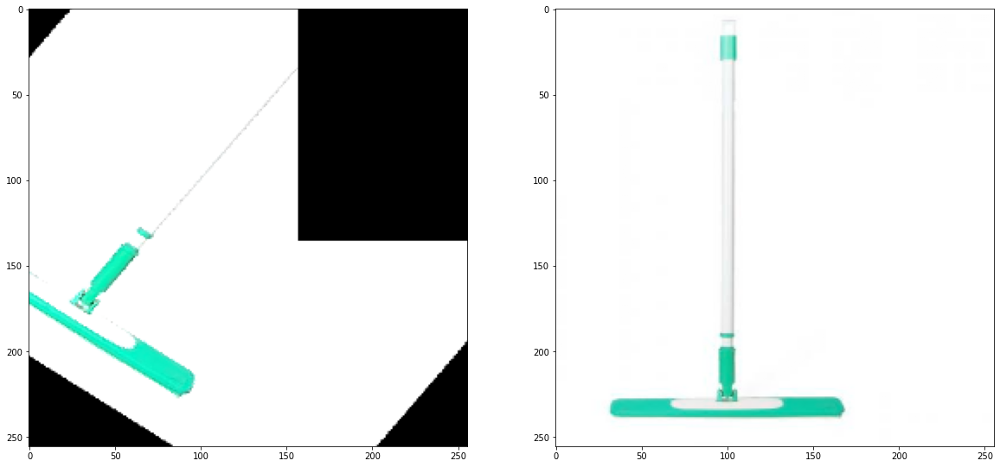

In [21]:

class ImagesDataset(Dataset):
    """Dataset for tabular data stored in csv format"""

    def __init__(self, path, input_transforms, output_transforms):
        super().__init__()
        self.input_transforms = input_transforms
        self.output_transforms = output_transforms
        self.paths = glob.glob(f"{path}/**/*.jpg", recursive=True) 
        self.paths += glob.glob(f"{path}/**/*.JPG", recursive=True)

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx: int):
        img = cv2.imread(self.paths[idx])
        
        input_img = self.input_transforms(img)
        output_img = self.output_transforms(img)

        return input_img, output_img

input_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomRotation(degrees=45),
    transforms.RandomPerspective(distortion_scale=0.25, p=0.3),
    transforms.RandomErasing(p=0.3, scale=(0.2, 0.2)),
    transforms.RandomResizedCrop(size=256, scale=(0.5, 1.2)),
    transforms.RandomAdjustSharpness(2),
    transforms.ColorJitter(brightness=.3, hue=0),

])

output_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((256, 256))
])


ds = ImagesDataset(IMGS_DIR, input_transforms, output_transforms)
loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True)

in_img = ds[0][0].permute(1, 2, 0).numpy()
out_img = ds[0][1].permute(1, 2, 0).numpy()

print(f'in_img: {in_img.shape} out_img: {out_img.shape}')

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(in_img)
plt.subplot(1, 2, 2)
plt.imshow(out_img)


Using cache found in /root/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type | Params
-------------------------------
0 | model | UNet | 7.8 M 
-------------------------------
7.8 M     Trainable params
0         Non-trainable params
7.8 M     Total params
31.052    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1896: PossibleUserWarning: The number of training batches (12) is smaller than the logging interval Trainer(log_every_n_steps=50). Se

Training: 0it [00:00, ?it/s]

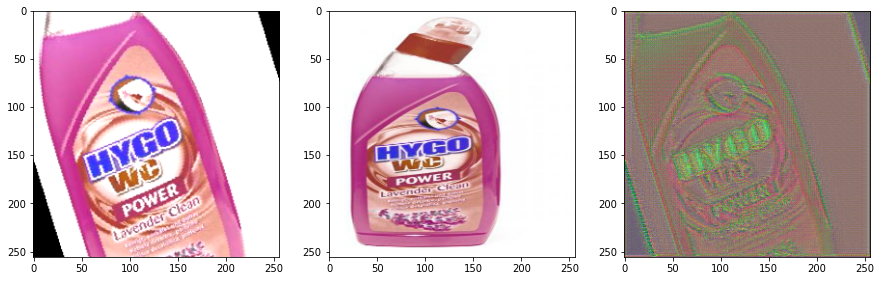

train loss: 0.18403136730194092


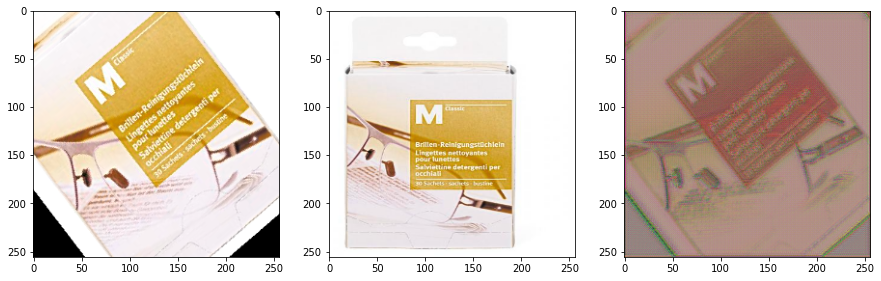

train loss: 0.16522768139839172


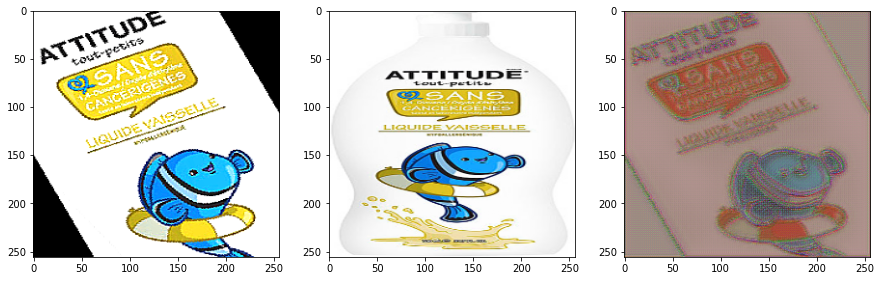

train loss: 0.15165697038173676


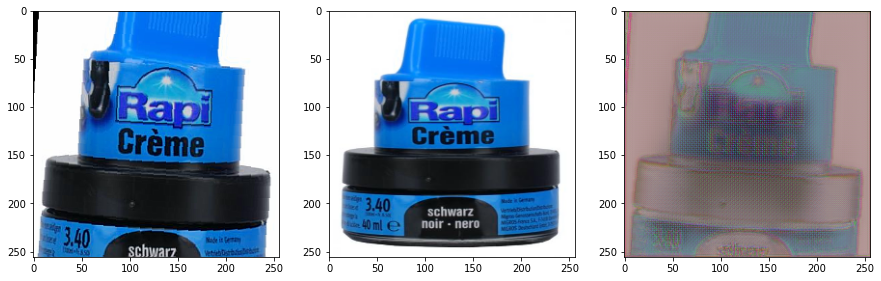

train loss: 0.13759928941726685


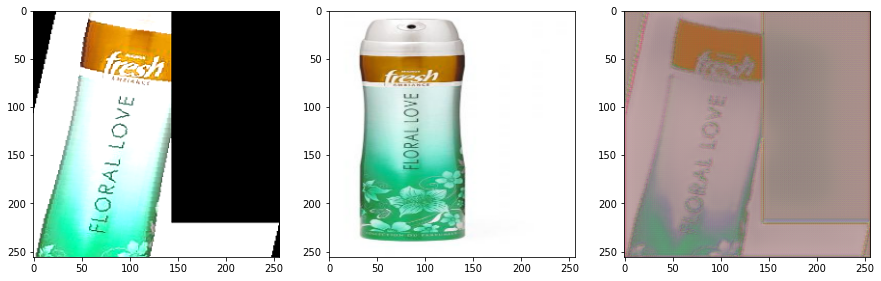

train loss: 0.12954020500183105


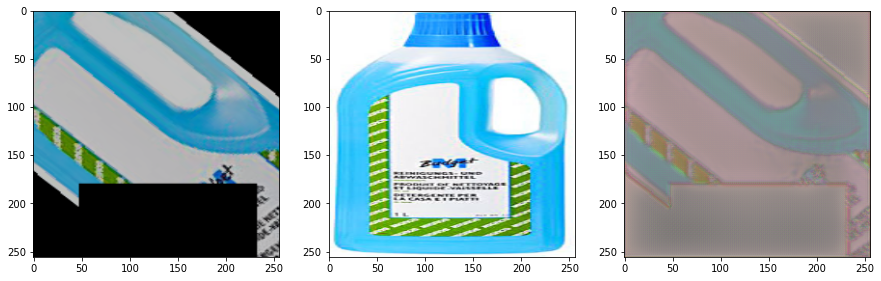

train loss: 0.11475588381290436


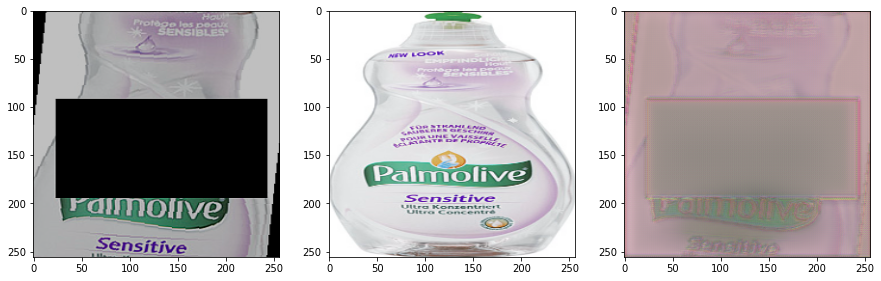

train loss: 0.12161263078451157


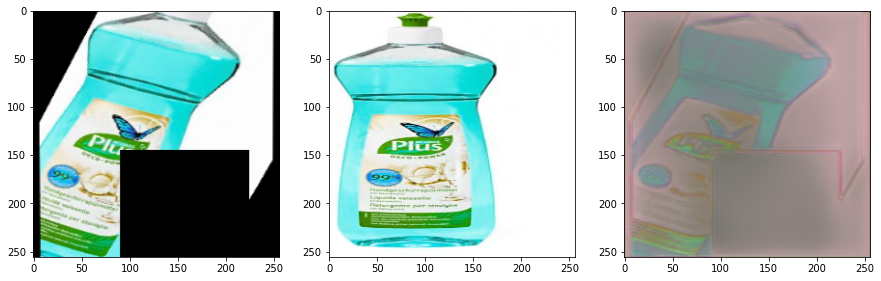

train loss: 0.11448769271373749


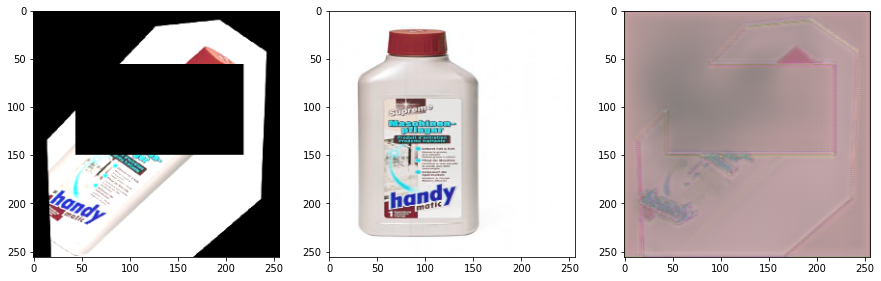

train loss: 0.10750117152929306


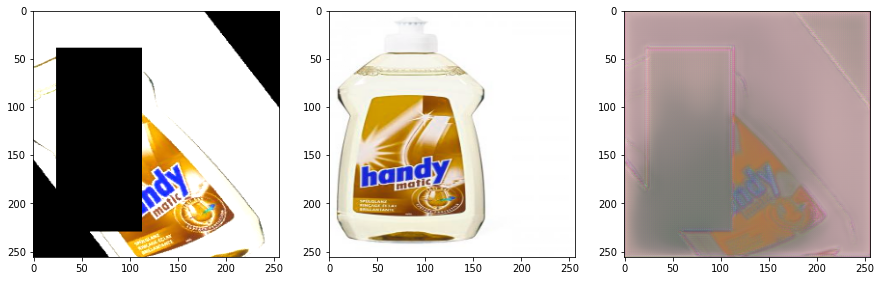

train loss: 0.11353107541799545


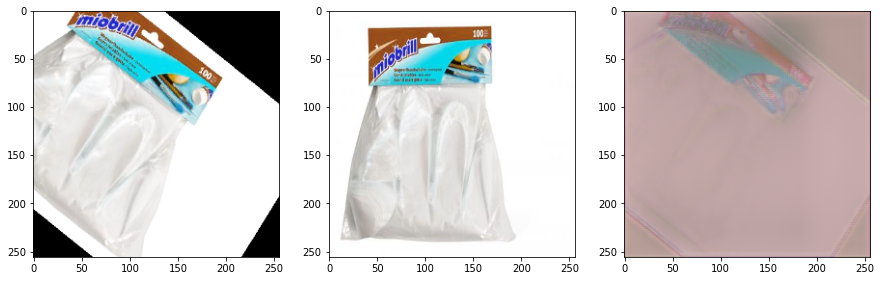

train loss: 0.10170324891805649


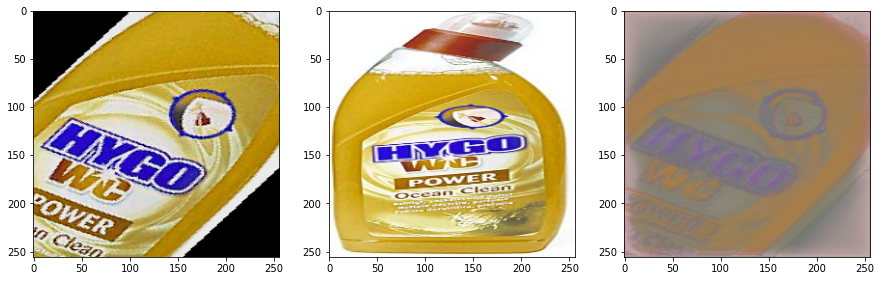

train loss: 0.11002442240715027


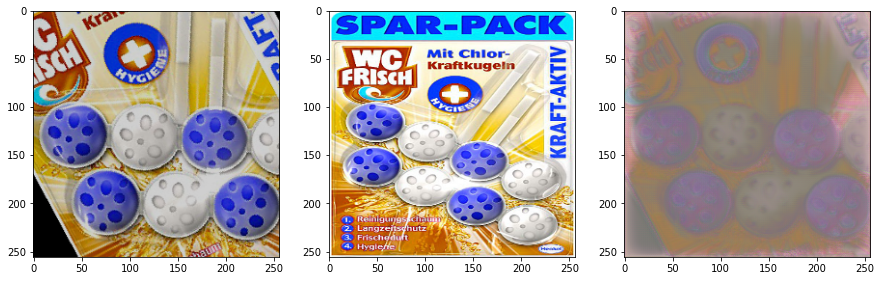

train loss: 0.10451042652130127


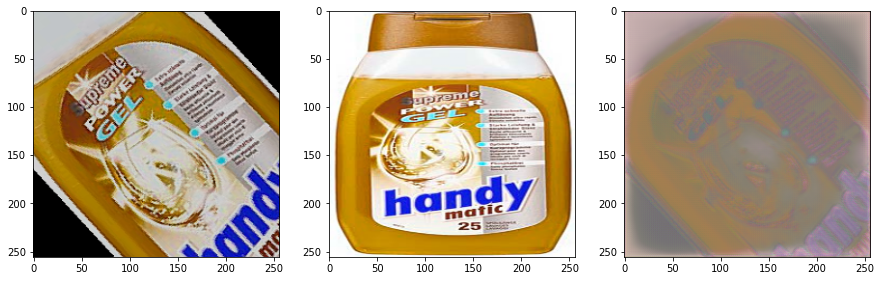

train loss: 0.10826905816793442


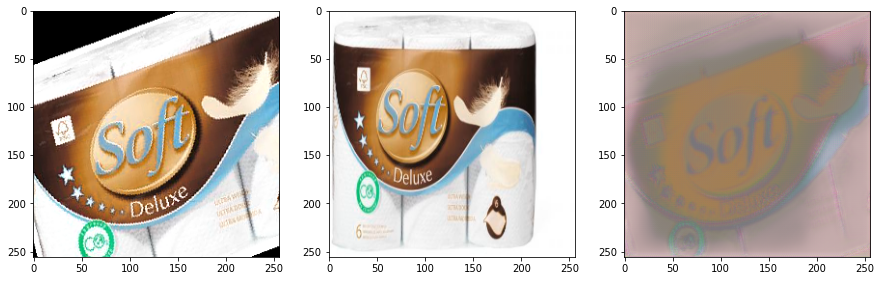

train loss: 0.09889434278011322


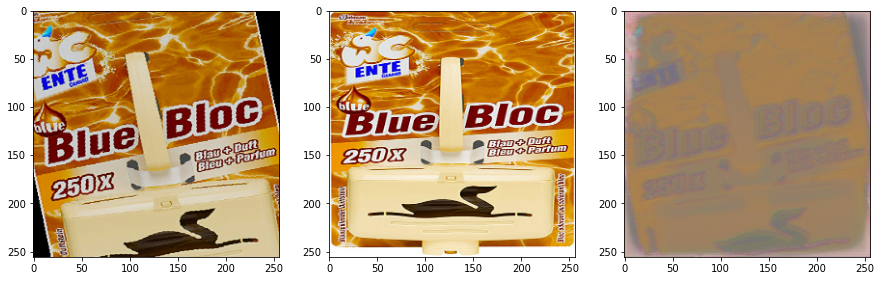

train loss: 0.09898435324430466


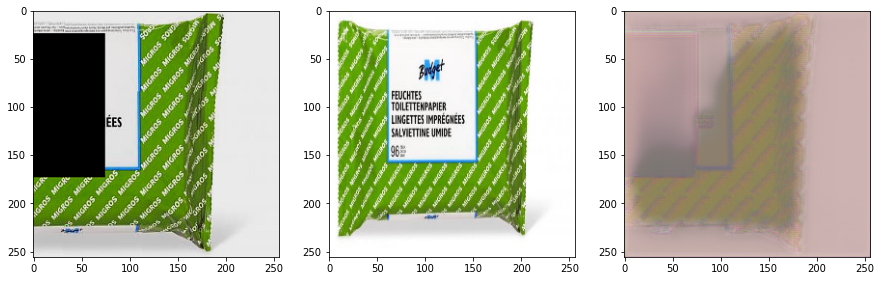

train loss: 0.09841609001159668


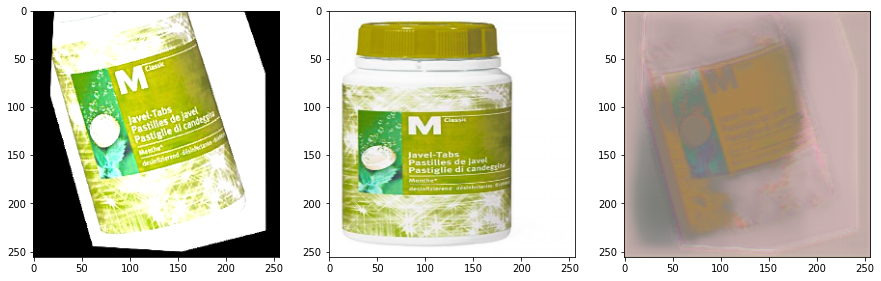

train loss: 0.09393808245658875


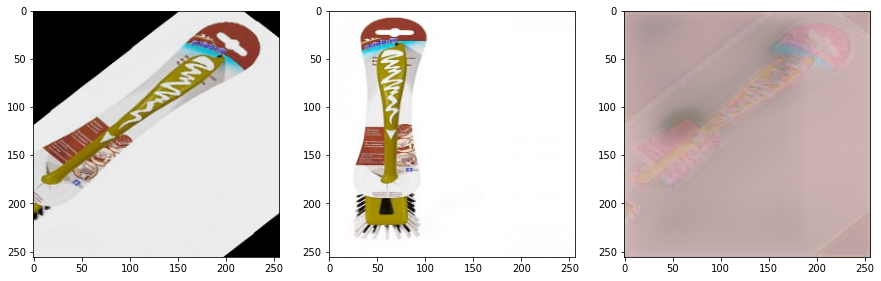

train loss: 0.09882115572690964


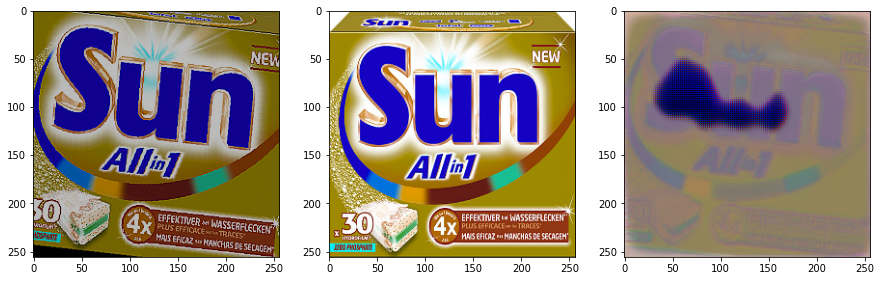

train loss: 0.0875551700592041


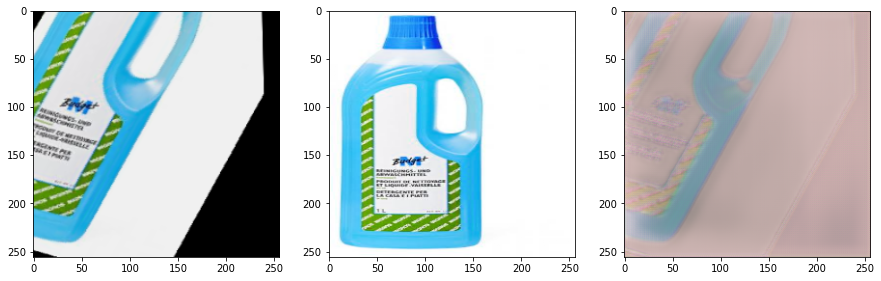

train loss: 0.09143614768981934


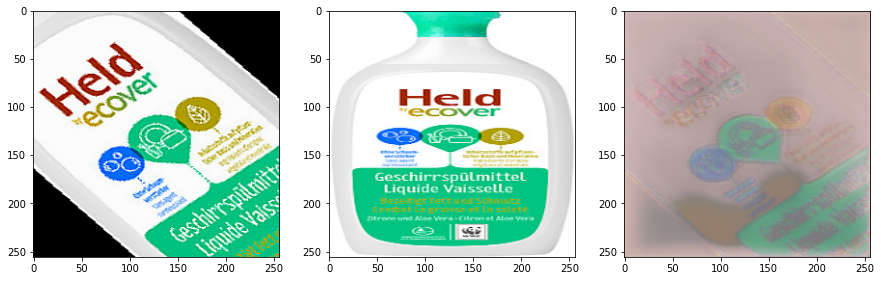

train loss: 0.09161846339702606


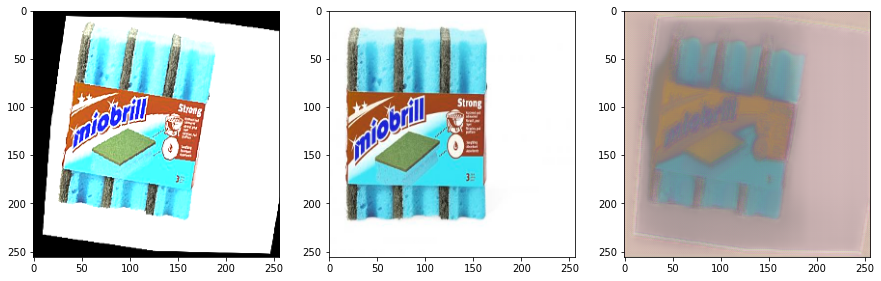

train loss: 0.0928361639380455


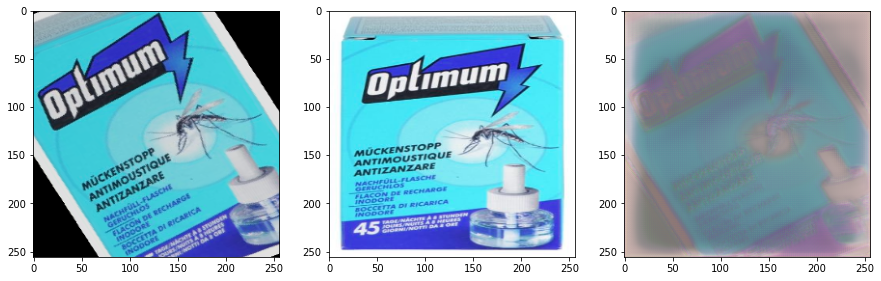

train loss: 0.08870812505483627


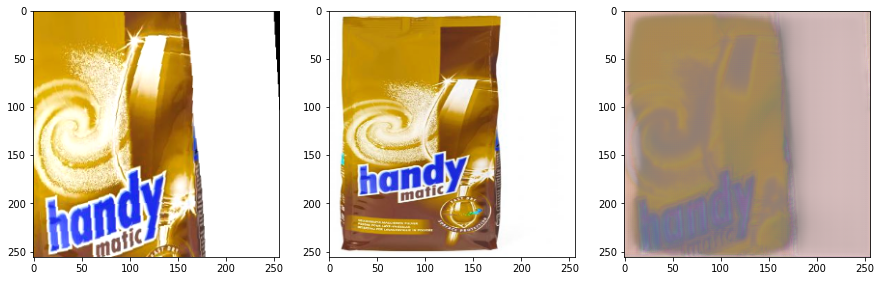

train loss: 0.08958418667316437


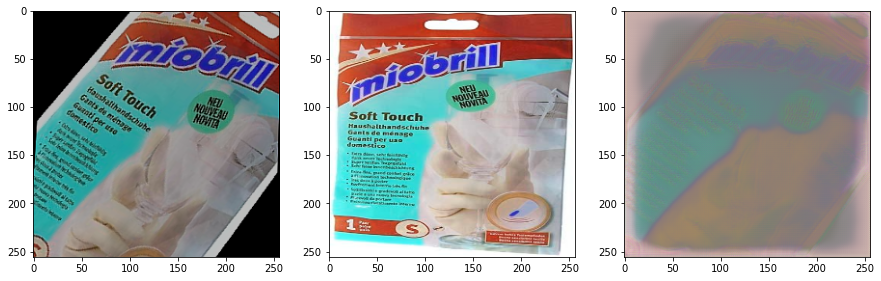

train loss: 0.09118101000785828


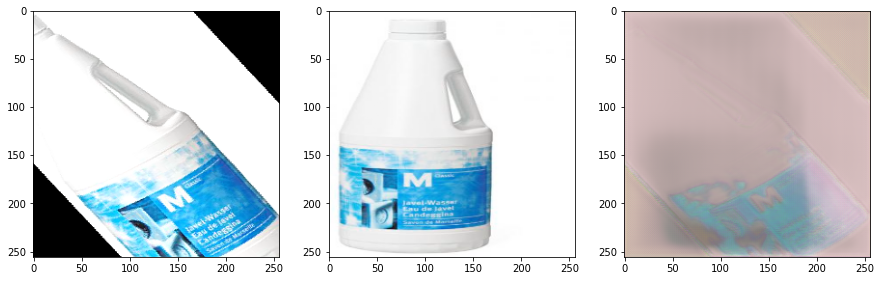

train loss: 0.08817034959793091


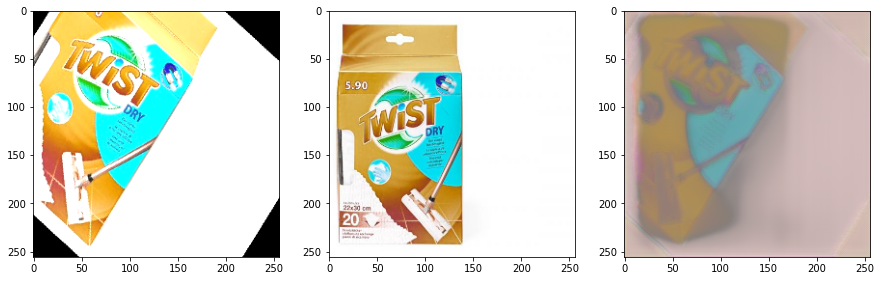

train loss: 0.08314560353755951


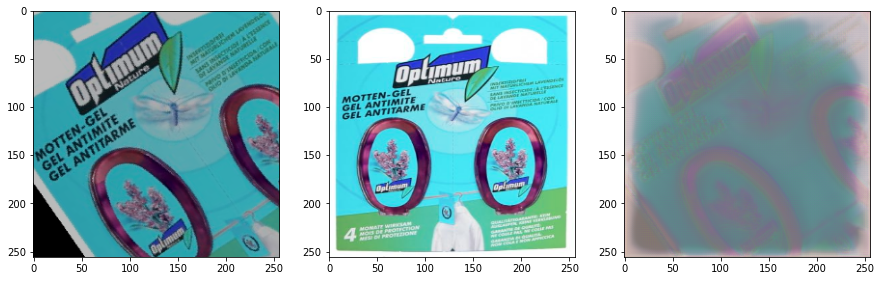

train loss: 0.08813562989234924


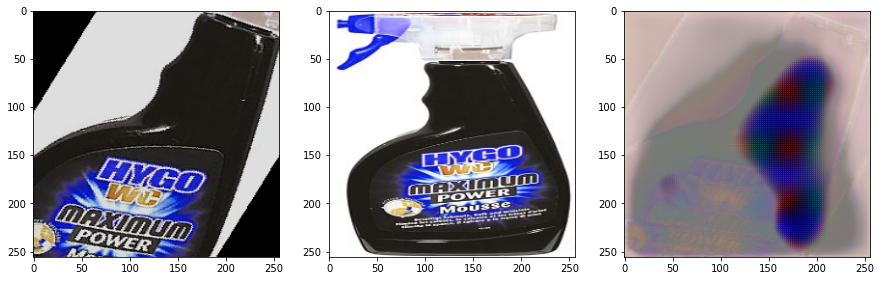

train loss: 0.08620189130306244


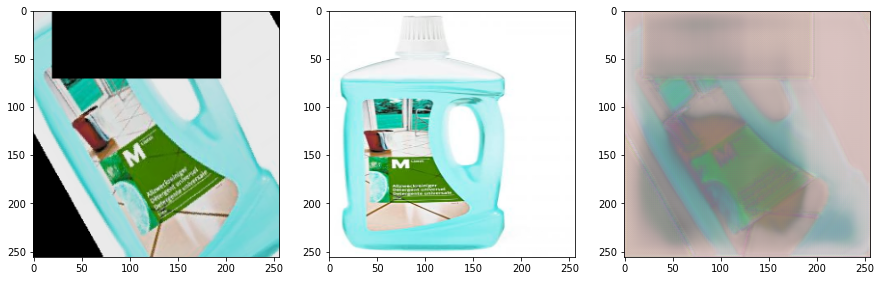

train loss: 0.08515876531600952


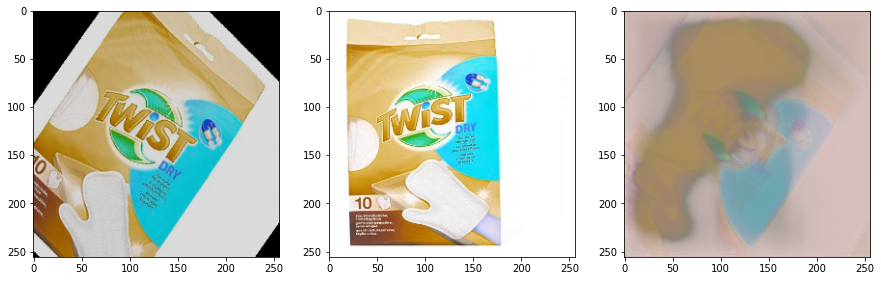

train loss: 0.08118417859077454


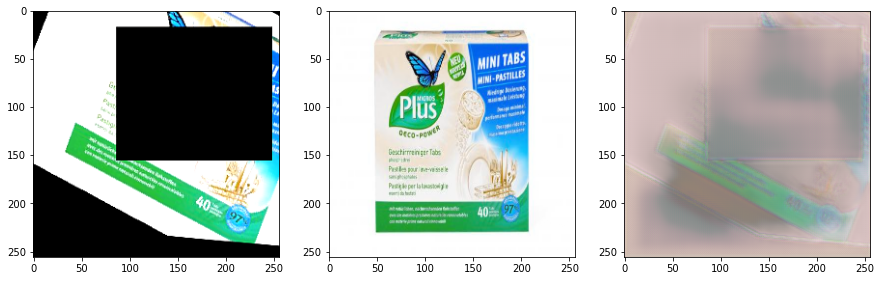

train loss: 0.07940968126058578


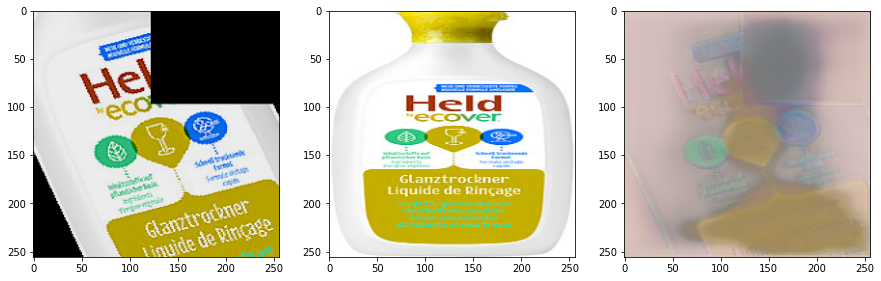

train loss: 0.09073188155889511


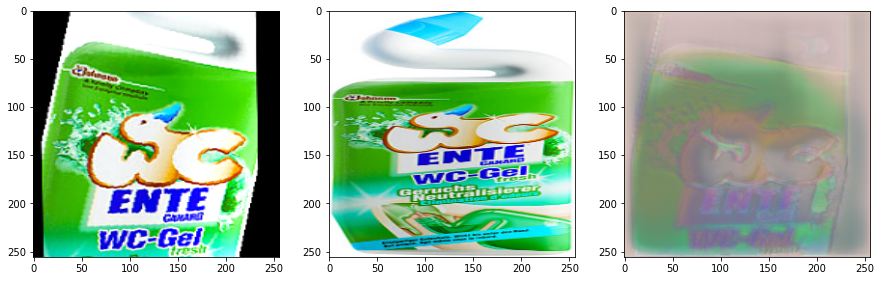

train loss: 0.08236823976039886


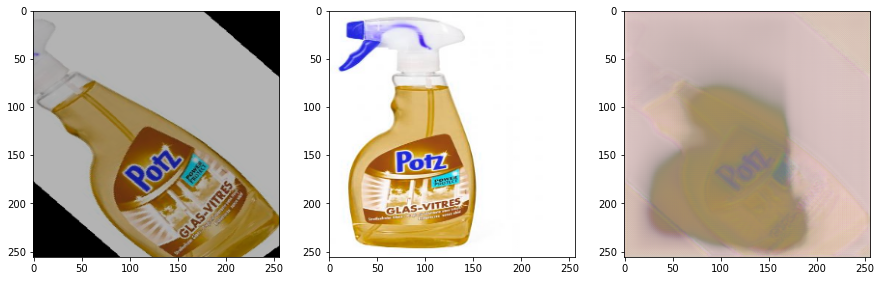

train loss: 0.08303635567426682


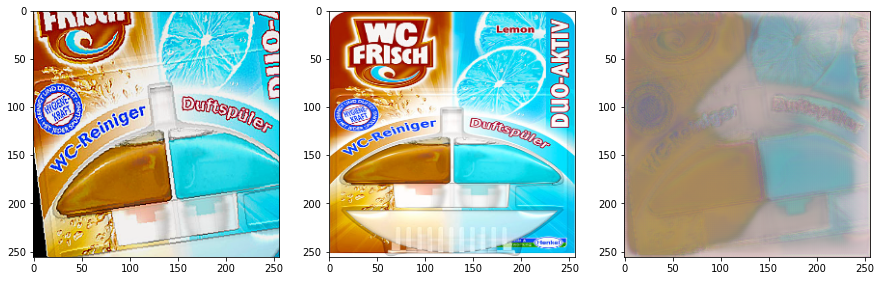

train loss: 0.0808793157339096


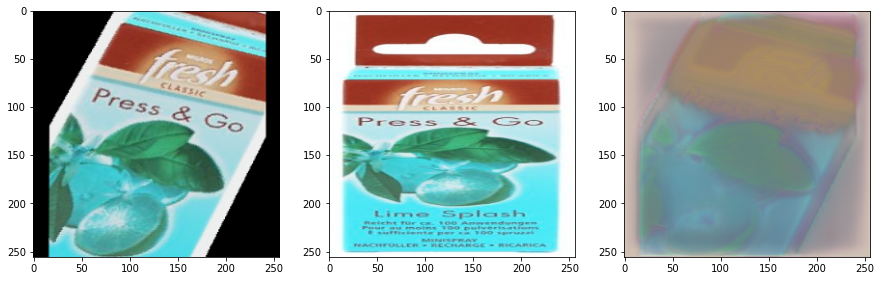

train loss: 0.08326166868209839


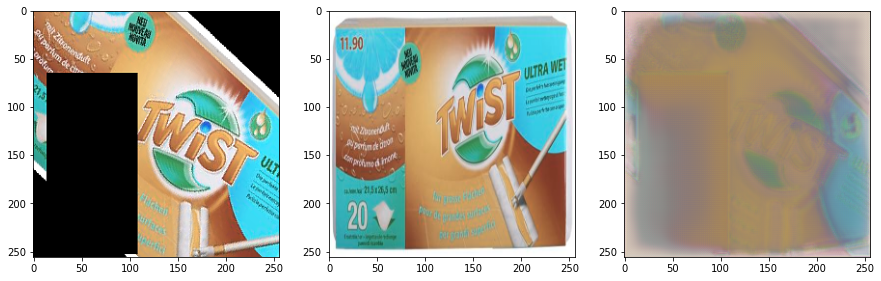

train loss: 0.08155371248722076


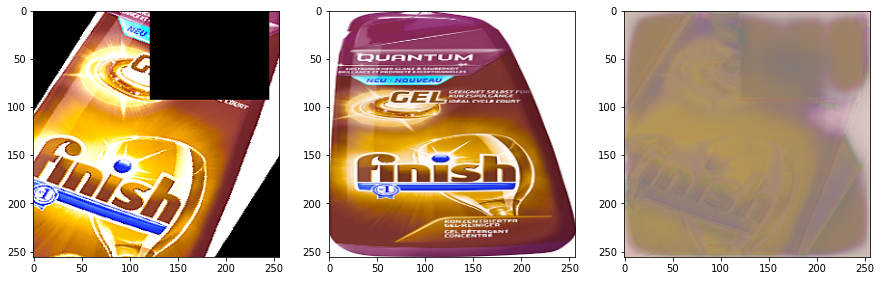

train loss: 0.07844947278499603


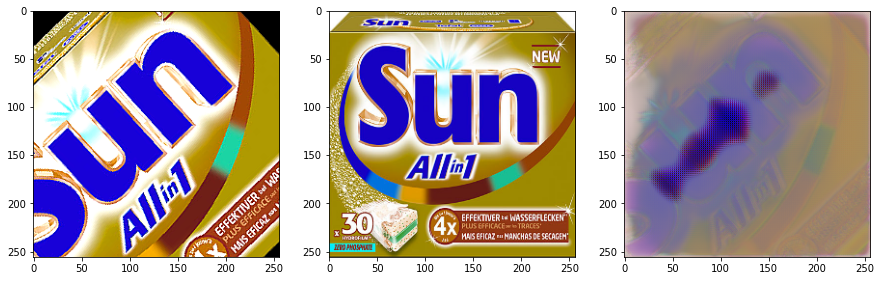

train loss: 0.07332746684551239


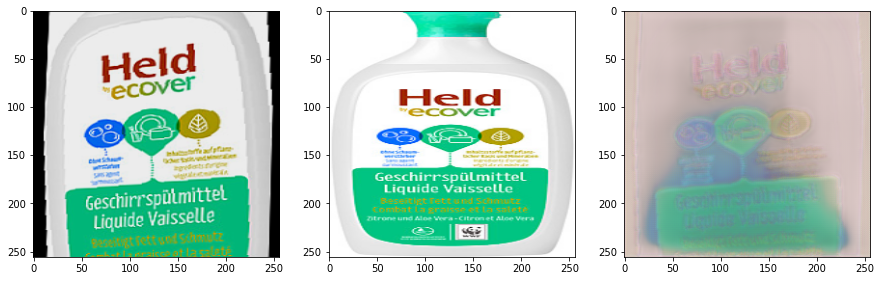

train loss: 0.07337891310453415


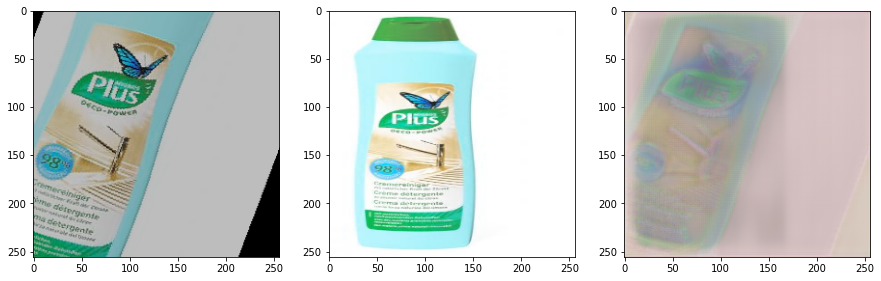

train loss: 0.07653841376304626


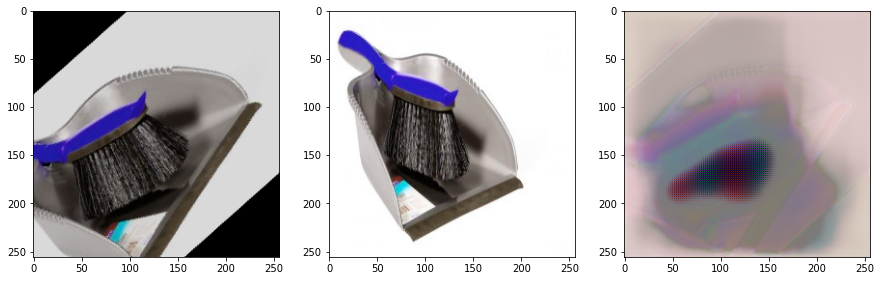

train loss: 0.07497101277112961


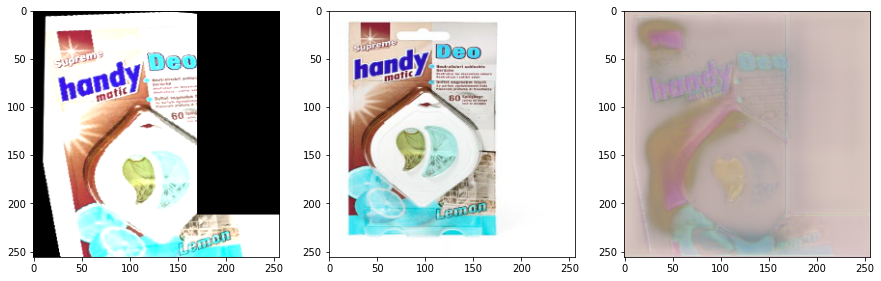

train loss: 0.07262210547924042


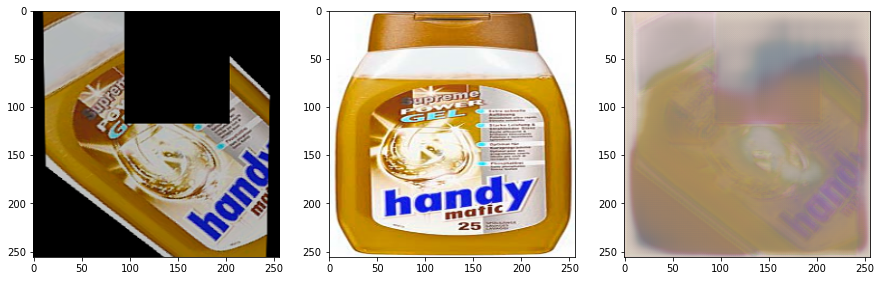

train loss: 0.07074876874685287


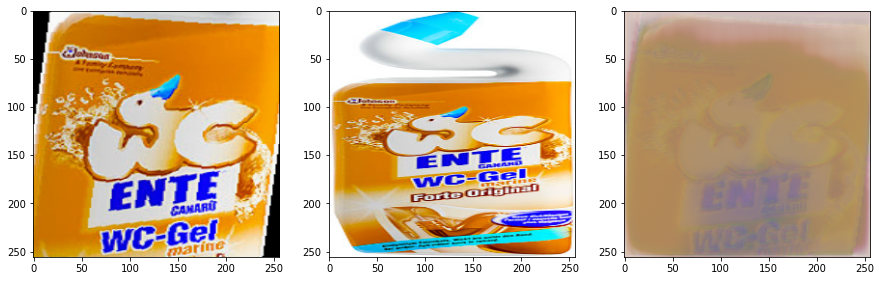

train loss: 0.07666754722595215


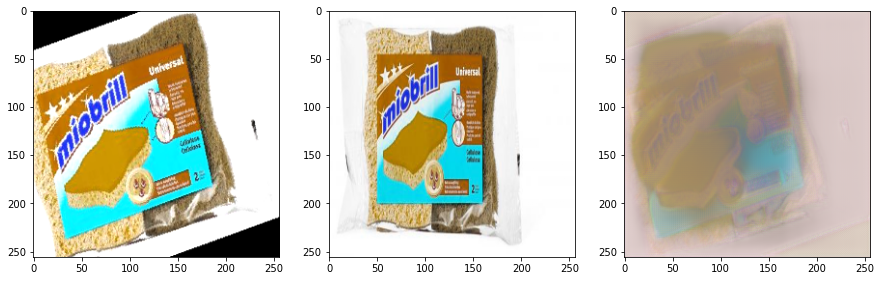

train loss: 0.07217630743980408


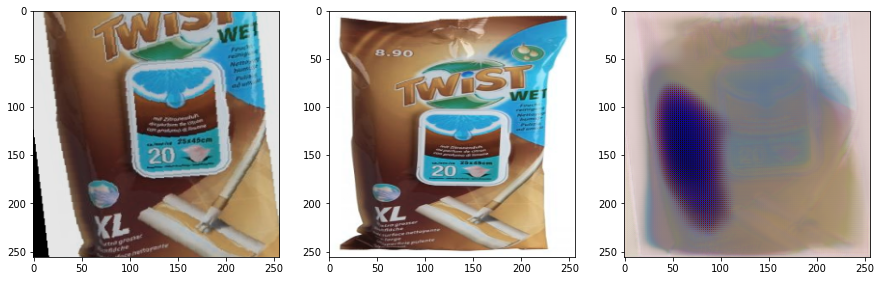

train loss: 0.06869764626026154


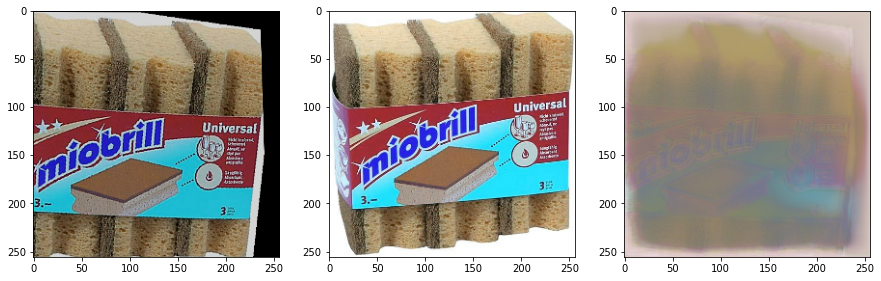

train loss: 0.07249335944652557


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:653: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [22]:

class DenoisingAutoEncoder(pl.LightningModule):
	def __init__(self):
		super().__init__()
		self.model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
      in_channels=3, out_channels=3, init_features=32, pretrained=False)

	def forward(self, x):
		prd = self.model(x)
		return prd

	def configure_optimizers(self):
		optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
		return optimizer

	def training_step(self, train_batch, batch_idx):
		x, y = train_batch
		x_hat = self.model(x)    
		loss = F.mse_loss(x_hat, y)
		self.log('train_loss', loss)
  
		if batch_idx % 30 == 0:
			x = x[0]
			y = y[0]
			x_hat = x_hat[0]
			plt.figure(figsize=(15, 5))
			plt.subplot(1, 3, 1)
			plt.imshow(x.permute(1, 2, 0).cpu().numpy())
			plt.subplot(1, 3, 2)
			plt.imshow(y.permute(1, 2, 0).cpu().numpy())
			plt.subplot(1, 3, 3)
			plt.imshow(x_hat.permute(1, 2, 0).cpu().detach().numpy())
			plt.show()
			sleep(1)   
			print(f'train loss: {loss}')

		return loss


# model
model = DenoisingAutoEncoder()

# training
plt.close('all')
trainer = pl.Trainer(accelerator='gpu', devices=1, max_epochs=NUM_EPOCHS)
trainer.fit(model, loader)
